# Set Up


In [6]:
import os
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = os.path.abspath(os.path.join(os.getcwd(), ".."))
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images")
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, f"{fig_id}.{fig_extension}")
    print(f"Saving figure {fig_id} at {path}")
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

### Load Dataset


In [7]:
df = pd.read_csv('../data/raw/StressLevelDataset.csv')
df.head(10)

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,...,basic_needs,academic_performance,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level
0,14,20,0,11,2,1,2,4,2,3,...,2,3,2,3,3,2,3,3,2,1
1,15,8,1,15,5,3,1,4,3,1,...,2,1,4,1,5,1,4,5,5,2
2,12,18,1,14,2,1,2,2,2,2,...,2,2,3,3,2,2,3,2,2,1
3,16,12,1,15,4,3,1,3,4,2,...,2,2,4,1,4,1,4,4,5,2
4,16,28,0,7,2,3,5,1,3,2,...,3,4,3,1,2,1,5,0,5,1
5,20,13,1,21,3,3,1,4,3,2,...,1,2,5,2,5,1,4,4,5,2
6,4,26,0,6,1,2,4,1,1,4,...,4,5,1,4,1,3,2,2,1,0
7,17,3,1,22,4,3,1,5,3,1,...,1,1,3,2,4,1,4,4,5,2
8,13,22,1,12,3,1,2,4,3,3,...,3,3,3,2,3,3,3,2,2,1
9,6,8,0,27,4,3,1,2,0,5,...,2,2,2,1,5,1,5,3,4,1


In [8]:
list(df.columns)

['anxiety_level',
 'self_esteem',
 'mental_health_history',
 'depression',
 'headache',
 'blood_pressure',
 'sleep_quality',
 'breathing_problem',
 'noise_level',
 'living_conditions',
 'safety',
 'basic_needs',
 'academic_performance',
 'study_load',
 'teacher_student_relationship',
 'future_career_concerns',
 'social_support',
 'peer_pressure',
 'extracurricular_activities',
 'bullying',
 'stress_level']

In [9]:
df.describe()

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,...,basic_needs,academic_performance,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level
count,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,...,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000
mean,11.063636,17.777273,0.492727,12.555455,2.508182,2.181818,2.660000,2.753636,2.649091,2.518182,...,2.772727,2.772727,2.621818,2.648182,2.649091,1.881818,2.734545,2.767273,2.617273,0.996364
std,6.117558,8.944599,0.500175,7.727008,1.409356,0.833575,1.548383,1.400713,1.328127,1.119208,...,1.433761,1.414594,1.315781,1.384579,1.529375,1.047826,1.425265,1.417562,1.530958,0.821673
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,11.000000,0.000000,6.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,2.000000,1.000000,0.000000
50%,11.000000,19.000000,0.000000,12.000000,3.000000,2.000000,2.500000,3.000000,3.000000,2.000000,...,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.500000,3.000000,1.000000
75%,16.000000,26.000000,1.000000,19.000000,3.000000,3.000000,4.000000,4.000000,3.000000,3.000000,...,4.000000,4.000000,3.000000,4.000000,4.000000,3.000000,4.000000,4.000000,4.000000,2.000000
max,21.000000,30.000000,1.000000,27.000000,5.000000,3.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,5.000000,5.000000,5.000000,2.000000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1100 entries, 0 to 1099
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype
---  ------                        --------------  -----
 0   anxiety_level                 1100 non-null   int64
 1   self_esteem                   1100 non-null   int64
 2   mental_health_history         1100 non-null   int64
 3   depression                    1100 non-null   int64
 4   headache                      1100 non-null   int64
 5   blood_pressure                1100 non-null   int64
 6   sleep_quality                 1100 non-null   int64
 7   breathing_problem             1100 non-null   int64
 8   noise_level                   1100 non-null   int64
 9   living_conditions             1100 non-null   int64
 10  safety                        1100 non-null   int64
 11  basic_needs                   1100 non-null   int64
 12  academic_performance          1100 non-null   int64
 13  study_load                    110

# Target Distribution


Saving figure stress_level_distribution at /Users/macbook/Downloads/HCMUT/Assignments/Data Mining/images/stress_level_distribution.png


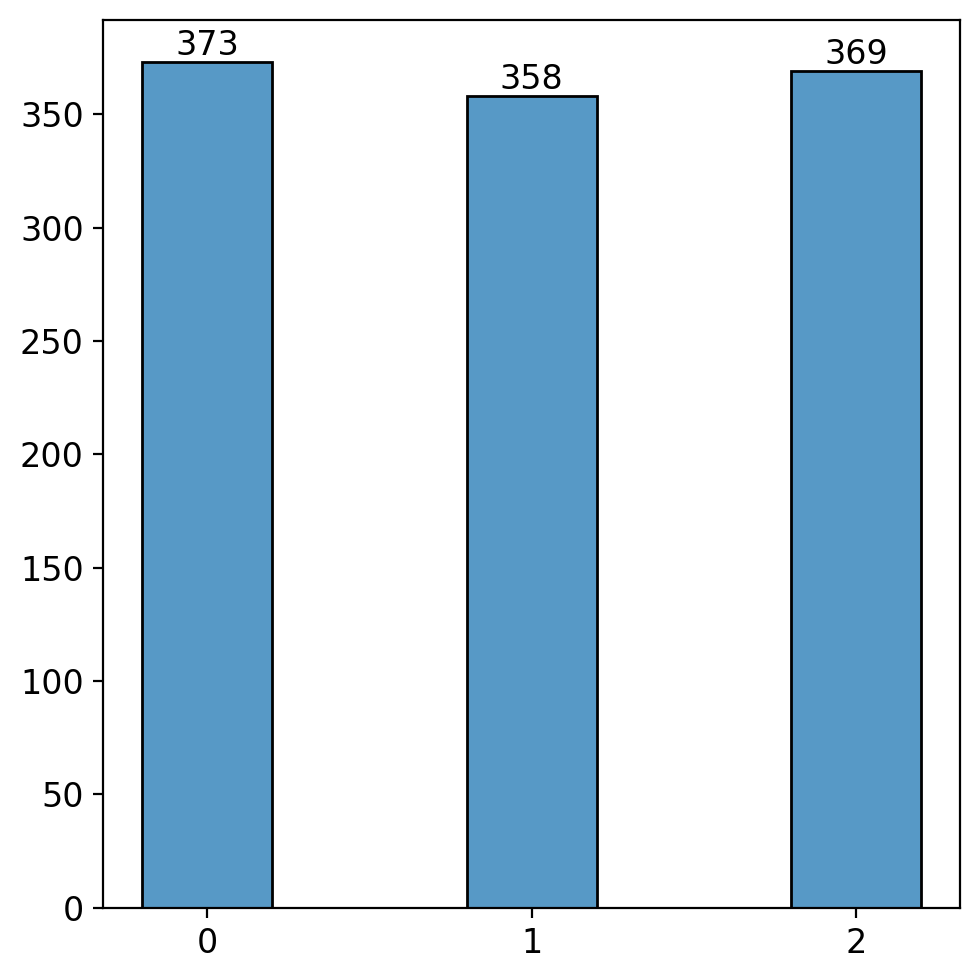

In [11]:
target_counts = df['stress_level'].value_counts().sort_index()
labels = target_counts.index.tolist()
sizes = target_counts.values

plt.figure(figsize=(5,5), dpi=200)
ax = sns.histplot(df['stress_level'], discrete=True, shrink=0.4, bins=range(int(df['stress_level'].min()), int(df['stress_level'].max())+2))

ax.set_xticks(range(int(df['stress_level'].min()), int(df['stress_level'].max())+1))

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.annotate(f'{height}', 
                    (p.get_x() + p.get_width()/2, height), 
                    ha='center', va='bottom', fontsize=12, color="black")

plt.title(None)
plt.xlabel(None)
plt.ylabel(None)
plt.tight_layout()
save_fig('stress_level_distribution')

# Correlation Heatmap


In [12]:
correlation_matrix = df.corr()
plt.figure(figsize=(54, 40.5), dpi=450)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
heatmap = sns.heatmap(
    correlation_matrix,
    mask=mask,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": .8, "orientation": "vertical", "label": "Correlation", "pad": 0.04},
    annot_kws={'size': 32},
    xticklabels=correlation_matrix.columns,
    yticklabels=correlation_matrix.index
)
heatmap.set_xticklabels(correlation_matrix.columns, fontsize=38, rotation=45, ha="right")
heatmap.set_yticklabels(correlation_matrix.index, fontsize=38, rotation=0)
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=38)
cbar.set_label("Correlation", size=38)
plt.tight_layout()
save_fig('correlation_heatmap')

Saving figure correlation_heatmap at /Users/macbook/Downloads/HCMUT/Assignments/Data Mining/images/correlation_heatmap.png


# Key Features' Distribution


Saving figure numeric_histograms at /Users/macbook/Downloads/HCMUT/Assignments/Data Mining/images/numeric_histograms.png


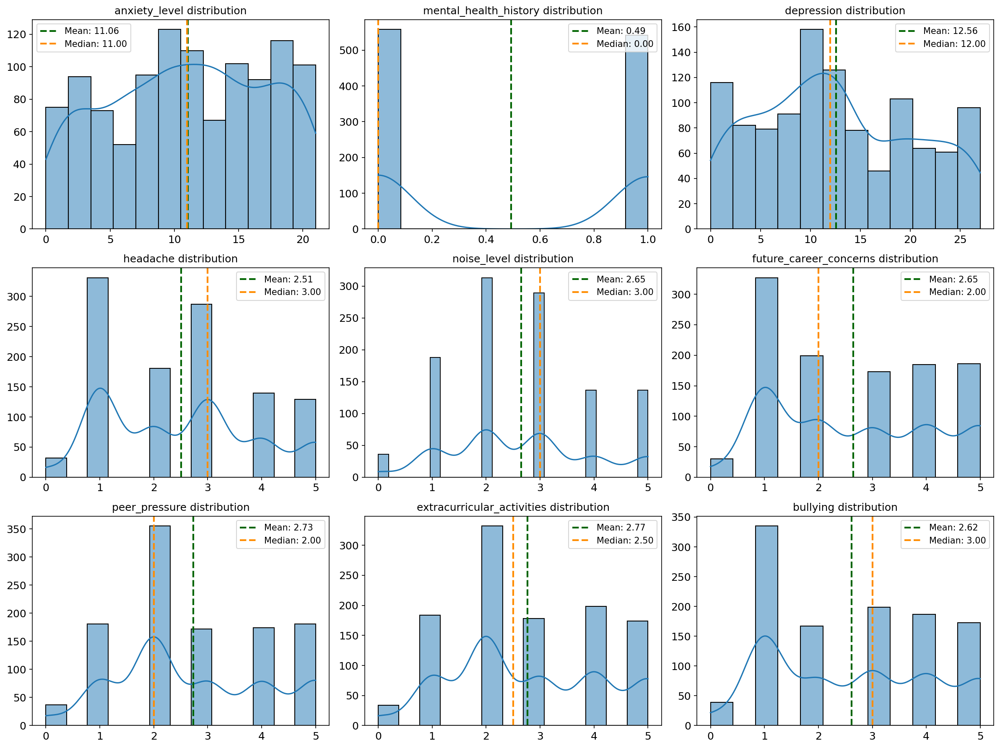

In [13]:
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
selected_cols = [c for c in numeric_cols if c in [
    'bullying', 'future_career_concerns', 'anxiety_level', 'depression', 'headache',
    'extracurricular_activities', 'peer_pressure', 'noise_level', 'mental_health_history'
]]
if len(selected_cols) == 0:
    selected_cols = numeric_cols[:6]

n = len(selected_cols)
cols = 3
rows = int(np.ceil(n/cols)) if n > 0 else 0
if n > 0:
    fig, axes = plt.subplots(rows, cols, figsize=(16, 4*rows), dpi=150)
    axes = np.array(axes).reshape(rows, cols)
    for idx, col in enumerate(selected_cols):
        r, c = divmod(idx, cols)
        ax = axes[r, c]
        sns.histplot(df[col], kde=True, ax=ax)
        mean_val = df[col].mean()
        median_val = df[col].median()
        ax.axvline(mean_val, color='darkgreen', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.2f}')
        ax.axvline(median_val, color='darkorange', linestyle='--', linewidth=2, label=f'Median: {median_val:.2f}')
        ax.legend()
        ax.set_title(f'{col} distribution')
        ax.set_xlabel(None)
        ax.set_ylabel(None)
    # Hide unused axes
    for j in range(idx+1, rows*cols):
        r, c = divmod(j, cols)
        axes[r, c].axis('off')
    plt.tight_layout()
    save_fig('numeric_histograms', resolution=300)
    plt.show()

# Violin Plots


Saving figure violinplots_by_stress_level at /Users/macbook/Downloads/HCMUT/Assignments/Data Mining/images/violinplots_by_stress_level.png


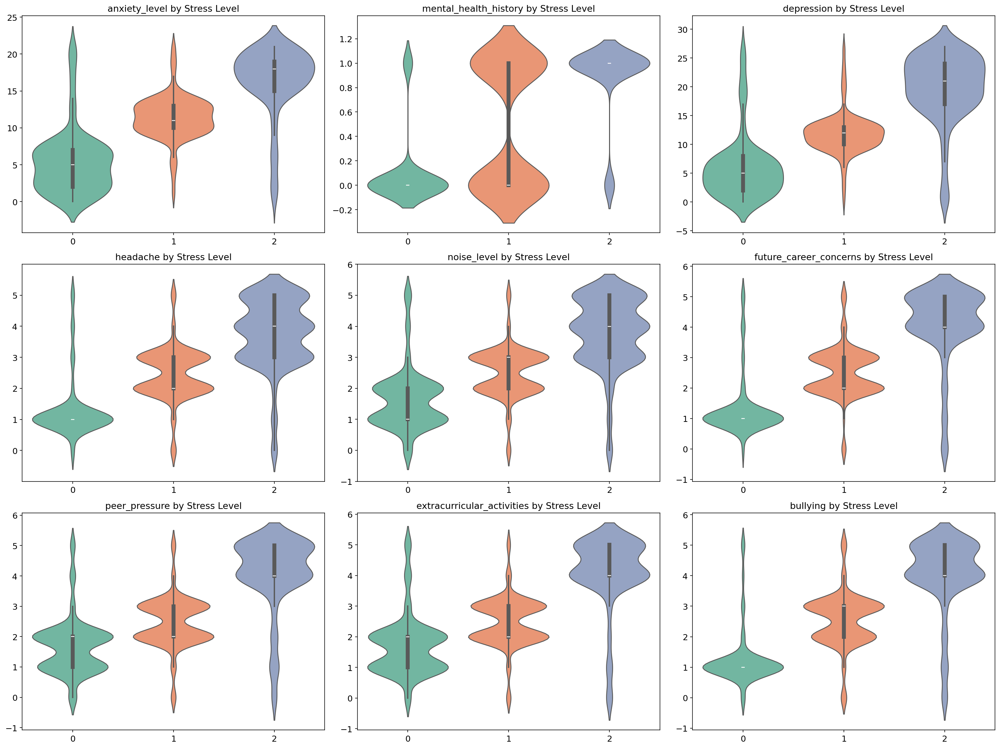

In [14]:
if 'stress_level' in df.columns and len(selected_cols) > 0:
    rows = int(np.ceil(len(selected_cols) / 3))
    cols = 3
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), dpi=150)
    axes = np.array(axes).reshape(rows, cols)
    
    for idx, col in enumerate(selected_cols):
        r, c = divmod(idx, cols)
        ax = axes[r, c]
        sns.violinplot(
            data=df,
            x='stress_level',
            y=col,
            inner='box',
            ax=ax,
            palette='Set2'
        )
        ax.set_title(f'{col} by Stress Level', fontsize=13)
        ax.set_xlabel(None)
        ax.set_ylabel(None)
    # Hide unused axes
    for j in range(idx+1, rows*cols):
        r, c = divmod(j, cols)
        axes[r, c].axis('off')
    plt.tight_layout()
    save_fig('violinplots_by_stress_level', resolution=300)
    plt.show()

Saving figure violinplots_iqr_cleaned at /Users/macbook/Downloads/HCMUT/Assignments/Data Mining/images/violinplots_iqr_cleaned.png


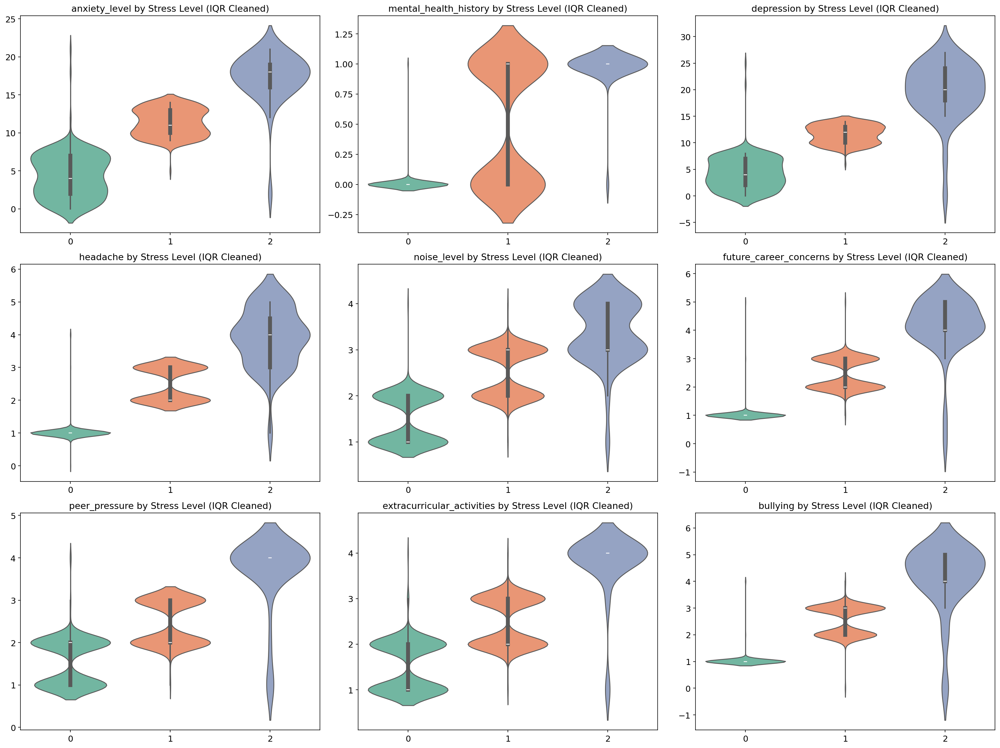

In [15]:
# Apply IQR-based outlier removal to all numeric columns except 'stress_level', then plot violinplots of features by stress level
numeric_cols = [col for col in df.select_dtypes(include=[np.number]).columns if col != 'stress_level']
df_iqr = df.copy()

for col in numeric_cols:
    Q1 = df_iqr[col].quantile(0.25)
    Q3 = df_iqr[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_iqr = df_iqr[(df_iqr[col] >= lower_bound) & (df_iqr[col] <= upper_bound)]

if 'stress_level' in df_iqr.columns and len(selected_cols) > 0:
    rows = int(np.ceil(len(selected_cols) / 3))
    cols = 3
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), dpi=150)
    axes = np.array(axes).reshape(rows, cols)

    for idx, col in enumerate(selected_cols):
        r, c = divmod(idx, cols)
        ax = axes[r, c]
        sns.violinplot(
            data=df_iqr,
            x='stress_level',
            y=col,
            inner='box',
            ax=ax,
            palette='Set2'
        )
        ax.set_title(f'{col} by Stress Level (IQR Cleaned)', fontsize=13)
        ax.set_xlabel(None)
        ax.set_ylabel(None)
    # Hide unused axes
    for j in range(idx + 1, rows * cols):
        r, c = divmod(j, cols)
        axes[r, c].axis('off')
    plt.tight_layout()
    save_fig('violinplots_iqr_cleaned', resolution=300)
    plt.show()

# Highly correlated pairs


Saving figure high_corr_scatterplots at /Users/macbook/Downloads/HCMUT/Assignments/Data Mining/images/high_corr_scatterplots.png


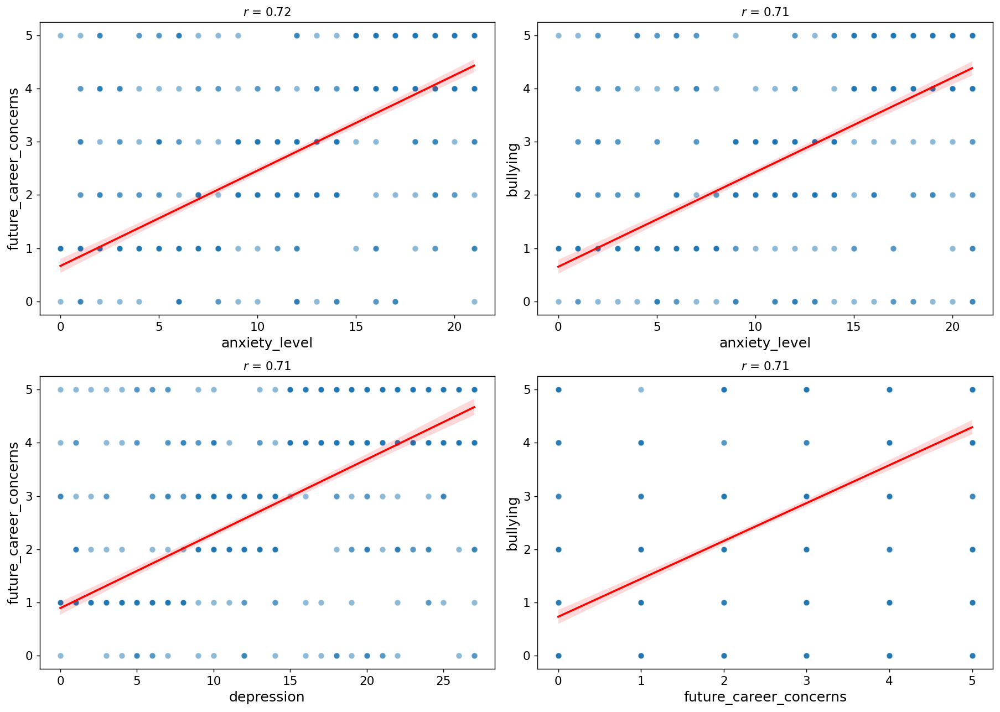

In [16]:
cor_matrix = df[selected_cols].corr()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))

corr_threshold = 0.7
high_corr_pairs = [
    (row, col, cor_matrix.loc[row, col])
    for row in upper_tri.index
    for col in upper_tri.columns
    if pd.notnull(upper_tri.loc[row, col]) and abs(upper_tri.loc[row, col]) >= corr_threshold
]

if high_corr_pairs:
    nplots = len(high_corr_pairs)
    rows = int(np.ceil(nplots / 2))
    cols = 2 if nplots > 1 else 1

    fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 5 * rows), dpi=130, squeeze=False)

    for idx, (x, y, corr_val) in enumerate(high_corr_pairs):
        r, c = divmod(idx, cols)
        ax = axes[r, c]
        sns.scatterplot(
            data=df,
            x=x,
            y=y,
            ax=ax,
            alpha=0.5,
        )
        sns.regplot(
            data=df,
            x=x,
            y=y,
            ax=ax,
            scatter=False,
            line_kws={'color': 'red', 'linewidth': 2}
        )
        ax.set_title(rf"$r$ = {corr_val:.2f}", fontsize=12)
        ax.set_xlabel(x)
        ax.set_ylabel(y)

    # Hide unused axes
    for j in range(idx + 1, rows * cols):
        r, c = divmod(j, cols)
        axes[r, c].axis('off')

    plt.tight_layout()
    save_fig('high_corr_scatterplots', resolution=300)
    plt.show()
else:
    print(f"No highly correlated pairs found (|r| ≥ {corr_threshold})")